In [1]:
import os
import random
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms, datasets, models
from torchvision.utils import make_grid

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import itertools

In [2]:
train_dir = "archive-intel/seg_train/seg_train"
valid_dir = "archive-intel/seg_test/seg_test"
pred_dir  = "archive-intel/seg_pred/seg_pred"

IMAGE_SIZE = 256
BATCH_SIZE = 16        # lower this if you run out of VRAM (e.g., 8 or 4)
NUM_EPOCHS = 12
LR = 1e-4
WEIGHT_DECAY = 1e-4
CUTMIX_PROB = 0.5
CUTMIX_ALPHA = 1.0
USE_FOCAL = True       # if False -> uses class-weighted CrossEntropy
FOCAL_GAMMA = 1.5

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 42

In [3]:
def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

seed_everything()

In [4]:
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.6, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

In [5]:
valid_transforms = transforms.Compose([
    transforms.Resize(int(IMAGE_SIZE * 1.15)),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

In [6]:
train_dataset = datasets.ImageFolder(train_dir, transform=train_transforms)
valid_dataset = datasets.ImageFolder(valid_dir, transform=valid_transforms)



num_classes = len(train_dataset.classes)
print("Classes:", train_dataset.classes, "Num classes:", num_classes)

Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'] Num classes: 6


In [7]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)



In [8]:
def compute_class_weights(dataset):
    counts = Counter([y for _, y in dataset.samples])
    total = sum(counts.values())
    weights = []
    for i in range(len(dataset.classes)):
        # inverse frequency
        weights.append(total / (counts[i] + 1e-8))
    w = np.array(weights)
    w = w / w.sum() * len(weights)  # normalize to num_classes
    return torch.tensor(w, dtype=torch.float)

class_weights = compute_class_weights(train_dataset).to(DEVICE)
print("Class weights:", class_weights)


Class weights: tensor([1.0654, 1.0279, 0.9710, 0.9293, 1.0265, 0.9800], device='cuda:0')


In [9]:
from torchvision import models
from torchvision.models import ConvNeXt_Tiny_Weights
import torch.nn as nn

def build_model(num_classes):
    # Load pretrained weights
    weights = ConvNeXt_Tiny_Weights.DEFAULT   # or IMAGENET1K_V1 / IMAGENET1K_V2
    
    model = models.convnext_tiny(weights=weights)

    # Replace classifier
    in_features = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_features, num_classes)

    return model

model = build_model(num_classes).to(DEVICE)


In [10]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=1.5, weight=None, reduction='mean'):
        super().__init__()
        self.gamma = gamma
        self.weight = weight
        self.reduction = reduction

    def forward(self, logits, targets):
        # logits: [B, C], targets: [B] (long)
        ce = F.cross_entropy(logits, targets, weight=self.weight, reduction='none')
        pt = torch.exp(-ce)  # pt = softmax prob of true class
        loss = ((1 - pt) ** self.gamma) * ce
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss

In [11]:
if USE_FOCAL:
    criterion = FocalLoss(gamma=FOCAL_GAMMA, weight=None).to(DEVICE)  # for CutMix use no weight here; we apply weighting if needed
else:
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(DEVICE)


In [12]:
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)


In [13]:
def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2


In [14]:
def train_one_epoch(model, loader, optimizer, criterion, device, cutmix_prob=CUTMIX_PROB, cutmix_alpha=CUTMIX_ALPHA):
    model.train()
    total_loss = 0.0
    all_preds = []
    all_labels = []

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        r = np.random.rand()
        if cutmix_alpha > 0 and r < cutmix_prob:
            # generate mixed sample
            lam = np.random.beta(cutmix_alpha, cutmix_alpha)
            rand_index = torch.randperm(images.size(0)).to(device)
            target_a = labels
            target_b = labels[rand_index]
            bbx1, bby1, bbx2, bby2 = rand_bbox(images.size(), lam)
            images[:, :, bbx1:bbx2, bby1:bby2] = images[rand_index, :, bbx1:bbx2, bby1:bby2]
            # adjust lambda to the exact pixel ratio
            lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (images.size(-1) * images.size(-2)))
            outputs = model(images)
            if USE_FOCAL:
                loss = lam * criterion(outputs, target_a) + (1 - lam) * criterion(outputs, target_b)
            else:
                # criterion is CrossEntropyLoss with weights baked in
                loss = lam * criterion(outputs, target_a) + (1 - lam) * criterion(outputs, target_b)
            preds = outputs.argmax(dim=1)
            # for metrics we pick argmax as usual (not strictly correct for CutMix but fine for running avg)
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
            preds = outputs.argmax(dim=1)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        all_preds.extend(preds.detach().cpu().numpy().tolist())
        all_labels.extend(labels.detach().cpu().numpy().tolist())

    avg_loss = total_loss / len(loader.dataset)
    acc = accuracy_score(all_labels, all_preds)
    return avg_loss, acc



In [15]:
def validate(model, loader, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)
            preds = probs.argmax(dim=1)

            all_probs.extend(probs.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    clf_report = classification_report(all_labels, all_preds, target_names=train_dataset.classes, digits=4, zero_division=0)
    confmat = confusion_matrix(all_labels, all_preds)
    return acc, clf_report, confmat, np.array(all_probs), np.array(all_preds), np.array(all_labels)


In [16]:
class GradCAM:
    def __init__(self, model, target_layer=None):
        self.model = model
        self.model.eval()
        self.activations = None
        self.gradients = None
        # find last Conv2d layer if not supplied
        if target_layer is None:
            self.target_layer = self._find_last_conv_layer()
        else:
            self.target_layer = target_layer

        # register hooks
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            # grad_out is a tuple
            self.gradients = grad_out[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def _find_last_conv_layer(self):
        for module in reversed(list(self.model.modules())):
            if isinstance(module, nn.Conv2d):
                return module
        raise ValueError("No Conv2d layer found in model")

    def __call__(self, input_tensor, class_idx=None):
        # input_tensor: [1, C, H, W], requires_grad not needed
        output = self.model(input_tensor)
        if class_idx is None:
            class_idx = int(output.argmax(dim=1).item())

        score = output[0, class_idx]
        self.model.zero_grad()
        score.backward(retain_graph=True)

        grads = self.gradients  # [B, C, H, W]
        acts = self.activations  # [B, C, H, W]
        weights = grads.mean(dim=(2, 3), keepdim=True)  # global average pool over H,W
        cam = (weights * acts).sum(dim=1, keepdim=True)  # [B,1,H,W]
        cam = F.relu(cam)
        cam = cam.squeeze(0).squeeze(0).cpu().numpy()
        # normalize
        cam = cam - cam.min()
        if cam.max() > 0:
            cam = cam / cam.max()
        return cam



In [17]:
def denormalize(tensor):
    # tensor: CxHxW
    t = tensor.cpu().clone()
    for c, (m, s) in enumerate(zip(imagenet_mean, imagenet_std)):
        t[c] = t[c] * s + m
    t = torch.clamp(t, 0, 1)
    return t


In [18]:
def plot_images_with_predictions(images, labels, preds, probs, class_names, title=None, ncols=4):
    n = len(images)
    nrows = int(np.ceil(n / ncols))
    plt.figure(figsize=(3 * ncols, 3 * nrows))
    for i in range(n):
        ax = plt.subplot(nrows, ncols, i + 1)
        img = denormalize(images[i])
        ax.imshow(np.transpose(img.numpy(), (1, 2, 0)))
        ax.axis('off')
        gt = class_names[labels[i]]
        pr = class_names[preds[i]]
        prob = probs[i].max()
        color = 'green' if preds[i] == labels[i] else 'red'
        ax.set_title(f"GT: {gt}\nPred: {pr} ({prob:.2f})", color=color)
    if title:
        plt.suptitle(title)
    plt.tight_layout()
    plt.show()

In [19]:
def plot_confusion_matrix(cm, classes, normalize=False, title="Confusion matrix"):
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-12)
    plt.figure(figsize=(7, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, ha='right')
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()




Epoch 1/12
Train loss: 0.3009 | Train acc: 0.8308
Val acc: 0.9370
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9827    0.9108    0.9454       437
      forest     0.9916    0.9979    0.9947       474
     glacier     0.8957    0.8698    0.8826       553
    mountain     0.8805    0.9124    0.8962       525
         sea     0.9740    0.9549    0.9644       510
      street     0.9181    0.9840    0.9499       501

    accuracy                         0.9370      3000
   macro avg     0.9404    0.9383    0.9389      3000
weighted avg     0.9379    0.9370    0.9370      3000



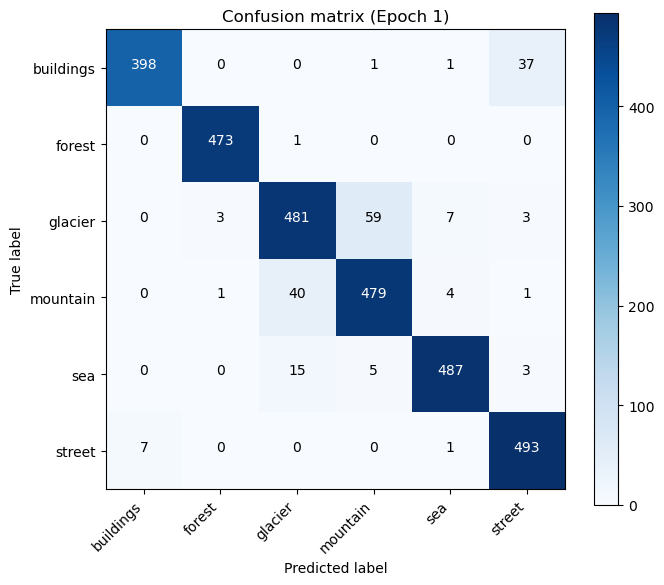

Saved best model.

Epoch 2/12
Train loss: 0.2292 | Train acc: 0.8497
Val acc: 0.9310
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9867    0.8513    0.9140       437
      forest     0.9916    0.9937    0.9926       474
     glacier     0.8737    0.9005    0.8869       553
    mountain     0.9084    0.8876    0.8979       525
         sea     0.9665    0.9627    0.9646       510
      street     0.8887    0.9880    0.9357       501

    accuracy                         0.9310      3000
   macro avg     0.9359    0.9306    0.9320      3000
weighted avg     0.9331    0.9310    0.9308      3000



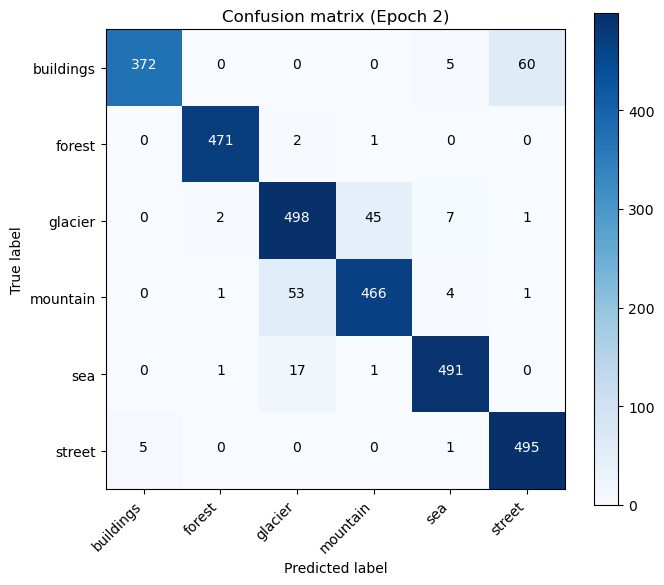


Epoch 3/12
Train loss: 0.2188 | Train acc: 0.8573
Val acc: 0.9223
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9750    0.8924    0.9319       437
      forest     0.9979    0.9810    0.9894       474
     glacier     0.9544    0.7577    0.8448       553
    mountain     0.7997    0.9581    0.8718       525
         sea     0.9558    0.9745    0.9650       510
      street     0.9029    0.9840    0.9417       501

    accuracy                         0.9223      3000
   macro avg     0.9309    0.9246    0.9241      3000
weighted avg     0.9288    0.9223    0.9217      3000



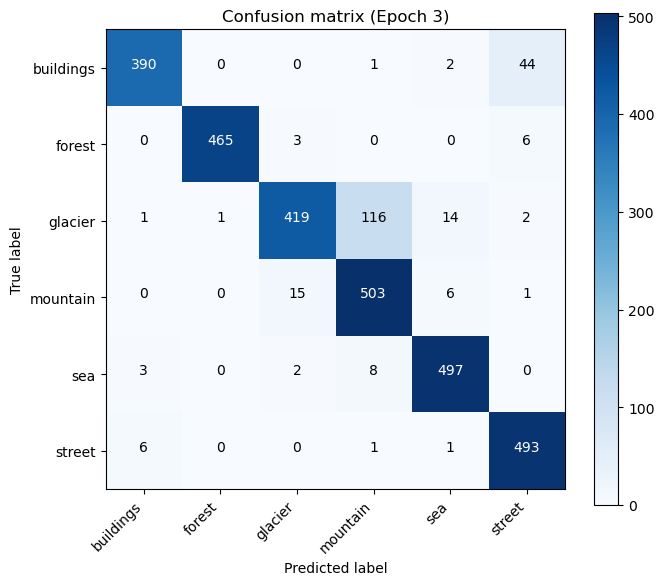


Epoch 4/12
Train loss: 0.1927 | Train acc: 0.8670
Val acc: 0.9247
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9847    0.8856    0.9325       437
      forest     0.9937    0.9979    0.9958       474
     glacier     0.8006    0.9439    0.8664       553
    mountain     0.9609    0.7486    0.8415       525
         sea     0.9564    0.9902    0.9730       510
      street     0.9114    0.9860    0.9473       501

    accuracy                         0.9247      3000
   macro avg     0.9346    0.9254    0.9261      3000
weighted avg     0.9310    0.9247    0.9238      3000



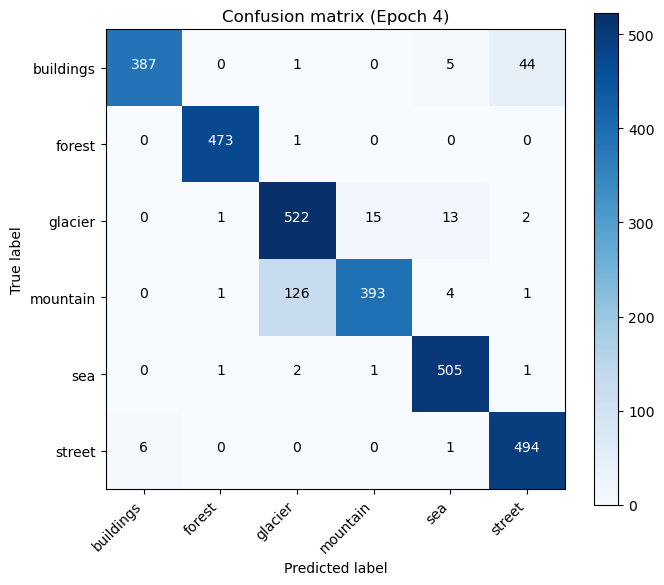


Epoch 5/12
Train loss: 0.1781 | Train acc: 0.8735
Val acc: 0.9393
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9757    0.9176    0.9458       437
      forest     0.9916    0.9916    0.9916       474
     glacier     0.9269    0.8481    0.8857       553
    mountain     0.8683    0.9295    0.8979       525
         sea     0.9597    0.9804    0.9699       510
      street     0.9316    0.9780    0.9542       501

    accuracy                         0.9393      3000
   macro avg     0.9423    0.9409    0.9409      3000
weighted avg     0.9403    0.9393    0.9391      3000



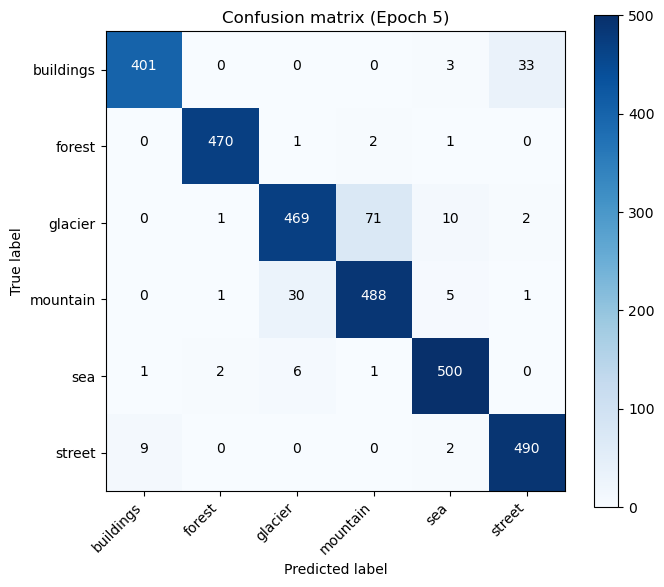

Saved best model.

Epoch 6/12
Train loss: 0.1583 | Train acc: 0.8873
Val acc: 0.9390
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9799    0.8947    0.9354       437
      forest     0.9915    0.9895    0.9905       474
     glacier     0.8648    0.9367    0.8993       553
    mountain     0.9468    0.8476    0.8945       525
         sea     0.9634    0.9804    0.9718       510
      street     0.9148    0.9860    0.9491       501

    accuracy                         0.9390      3000
   macro avg     0.9435    0.9392    0.9401      3000
weighted avg     0.9411    0.9390    0.9388      3000



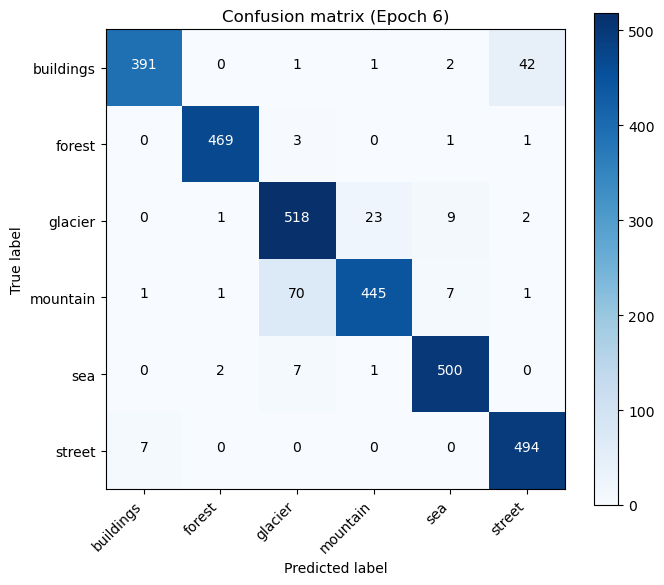


Epoch 7/12
Train loss: 0.1629 | Train acc: 0.8843
Val acc: 0.9430
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9554    0.9314    0.9432       437
      forest     0.9936    0.9873    0.9905       474
     glacier     0.9113    0.8915    0.9013       553
    mountain     0.9032    0.9067    0.9049       525
         sea     0.9654    0.9843    0.9748       510
      street     0.9379    0.9641    0.9508       501

    accuracy                         0.9430      3000
   macro avg     0.9445    0.9442    0.9442      3000
weighted avg     0.9429    0.9430    0.9429      3000



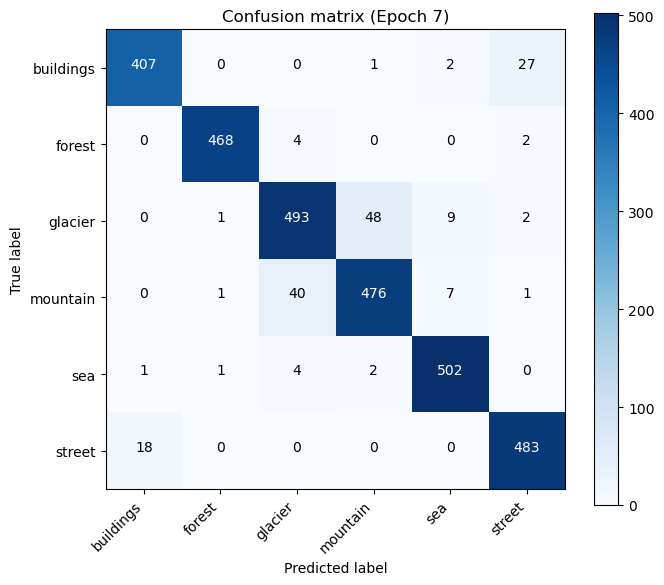

Saved best model.

Epoch 8/12
Train loss: 0.1405 | Train acc: 0.9049
Val acc: 0.9487
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9670    0.9382    0.9524       437
      forest     0.9916    0.9916    0.9916       474
     glacier     0.9086    0.9168    0.9127       553
    mountain     0.9270    0.8952    0.9109       525
         sea     0.9635    0.9824    0.9728       510
      street     0.9439    0.9741    0.9587       501

    accuracy                         0.9487      3000
   macro avg     0.9503    0.9497    0.9498      3000
weighted avg     0.9487    0.9487    0.9485      3000



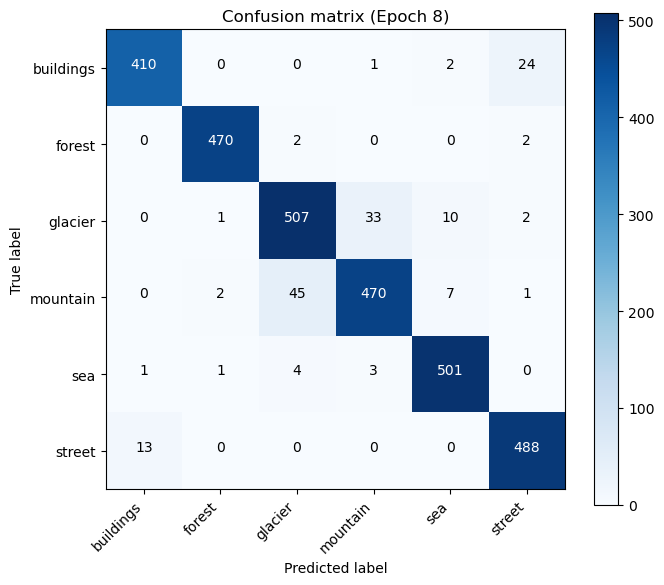

Saved best model.

Epoch 9/12
Train loss: 0.1339 | Train acc: 0.8982
Val acc: 0.9490
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9490    0.9359    0.9424       437
      forest     0.9937    0.9937    0.9937       474
     glacier     0.9153    0.9186    0.9170       553
    mountain     0.9316    0.9086    0.9200       525
         sea     0.9654    0.9843    0.9748       510
      street     0.9449    0.9581    0.9514       501

    accuracy                         0.9490      3000
   macro avg     0.9500    0.9499    0.9499      3000
weighted avg     0.9489    0.9490    0.9489      3000



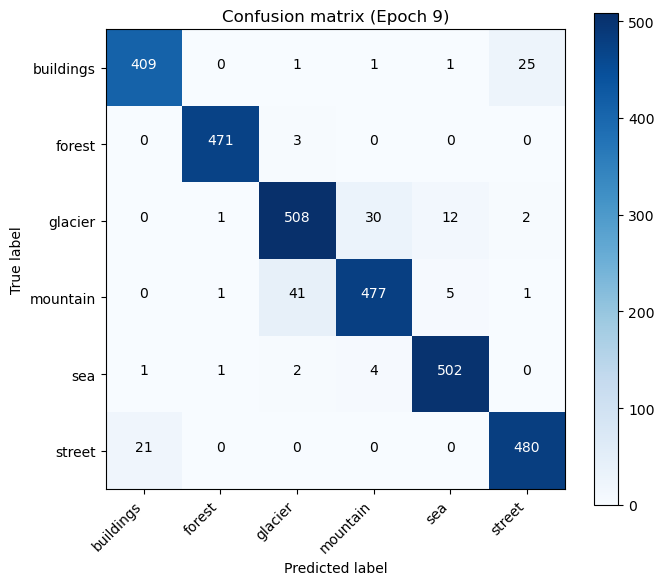

Saved best model.

Epoch 10/12
Train loss: 0.1335 | Train acc: 0.9052
Val acc: 0.9490
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9580    0.9405    0.9492       437
      forest     0.9916    0.9958    0.9937       474
     glacier     0.9367    0.8825    0.9088       553
    mountain     0.9007    0.9333    0.9167       525
         sea     0.9654    0.9843    0.9748       510
      street     0.9490    0.9661    0.9575       501

    accuracy                         0.9490      3000
   macro avg     0.9502    0.9504    0.9501      3000
weighted avg     0.9491    0.9490    0.9488      3000



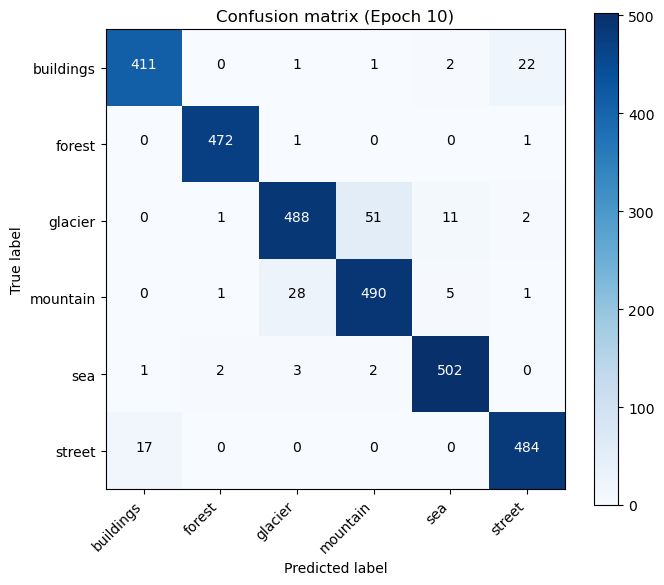


Epoch 11/12
Train loss: 0.1296 | Train acc: 0.9029
Val acc: 0.9483
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9625    0.9405    0.9514       437
      forest     0.9895    0.9937    0.9916       474
     glacier     0.9187    0.8987    0.9086       553
    mountain     0.9094    0.9181    0.9137       525
         sea     0.9689    0.9784    0.9737       510
      street     0.9491    0.9681    0.9585       501

    accuracy                         0.9483      3000
   macro avg     0.9497    0.9496    0.9496      3000
weighted avg     0.9483    0.9483    0.9482      3000



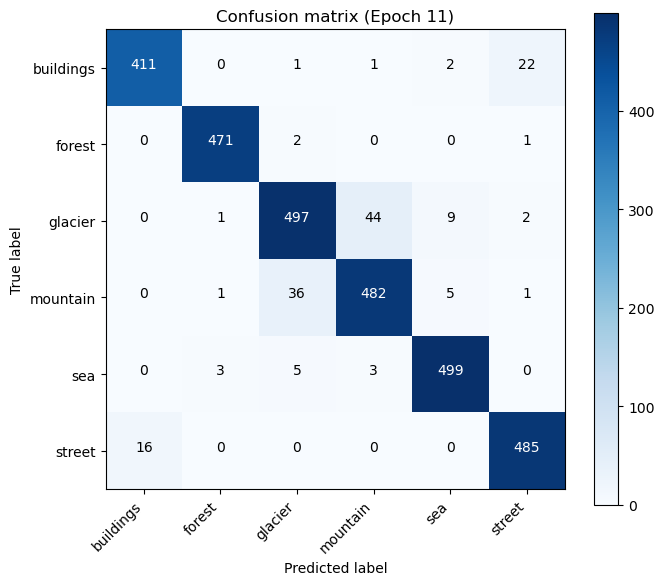


Epoch 12/12
Train loss: 0.1175 | Train acc: 0.9172
Val acc: 0.9487
Validation classification report:
               precision    recall  f1-score   support

   buildings     0.9470    0.9405    0.9437       437
      forest     0.9958    0.9937    0.9947       474
     glacier     0.9180    0.9114    0.9147       553
    mountain     0.9195    0.9143    0.9169       525
         sea     0.9690    0.9804    0.9747       510
      street     0.9486    0.9581    0.9533       501

    accuracy                         0.9487      3000
   macro avg     0.9497    0.9497    0.9497      3000
weighted avg     0.9486    0.9487    0.9486      3000



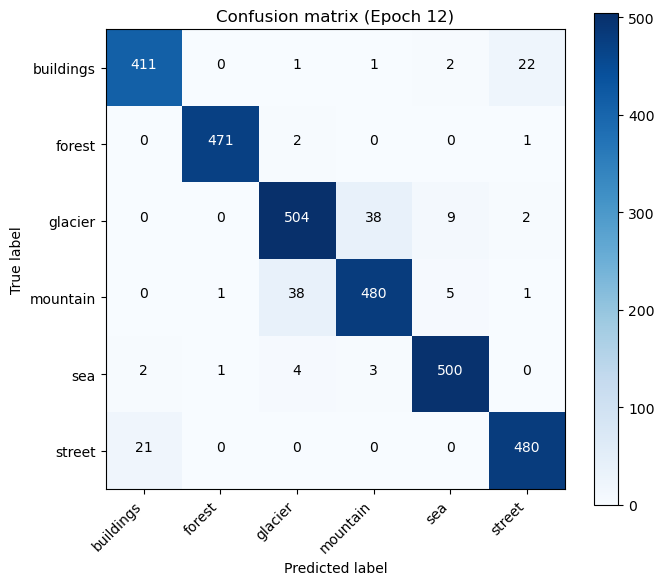

In [20]:
best_val_acc = 0.0
for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, DEVICE)
    scheduler.step()
    val_acc, val_report, val_confmat, val_probs, val_preds, val_labels = validate(model, valid_loader, DEVICE)

    print(f"Train loss: {train_loss:.4f} | Train acc: {train_acc:.4f}")
    print(f"Val acc: {val_acc:.4f}")
    print("Validation classification report:\n", val_report)
    plot_confusion_matrix(val_confmat, classes=train_dataset.classes, normalize=False, title=f"Confusion matrix (Epoch {epoch+1})")

    # Save best
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "best_convnext_tiny.pth")
        print("Saved best model.")

Quick explanation of the main pieces

Model: torchvision.models.convnext_tiny with final classifier adjusted to num_classes.

Transforms: RandomResizedCrop(256), horizontal flips and ColorJitter; validation uses resize+center crop.

CutMix: implemented in train_one_epoch — when applied the loss is a convex combination of targets.

Loss: FocalLoss (γ=1.5) implemented; option to use CrossEntropyLoss with computed class weights.

Optimizer/Scheduler: AdamW + CosineAnnealingLR.

Metrics: accuracy, sklearn classification_report, confusion matrix plotted.

XAI: simple Grad-CAM hooking the last nn.Conv2d in the model dynamically; overlay plotted on images.

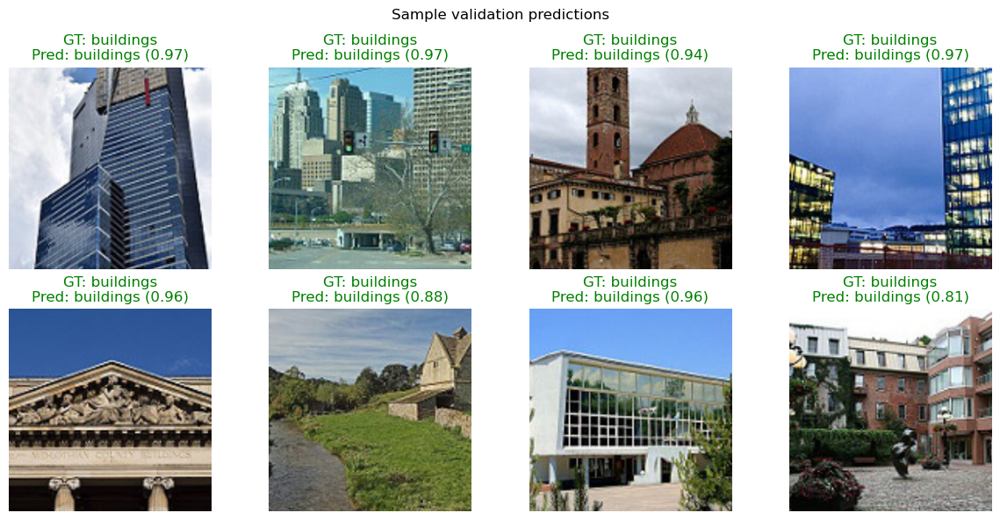

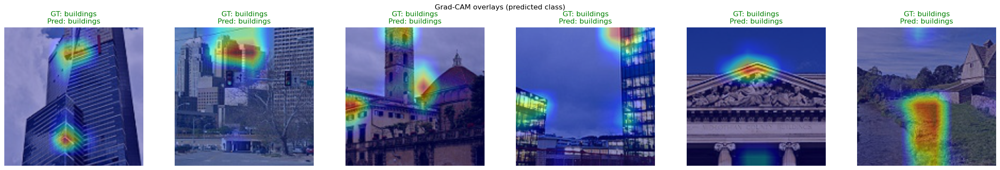

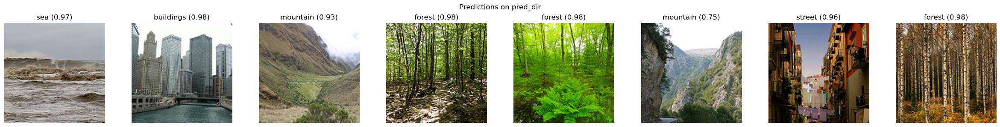

Done.


In [23]:
# load best model
model.load_state_dict(torch.load("best_convnext_tiny.pth", map_location=DEVICE))
model.to(DEVICE)
model.eval()

# pick a few images from validation set (first batch)
dataiter = iter(valid_loader)
images, labels = next(dataiter)
images_cpu = images[:8]   # show 8
images = images[:8].to(DEVICE)
labels = labels[:8].to(DEVICE)

with torch.no_grad():
    outputs = model(images)
    probs = F.softmax(outputs, dim=1)
    preds = probs.argmax(dim=1)

# Plot a grid of images with predictions
plot_images_with_predictions(images_cpu, labels.cpu().numpy(), preds.cpu().numpy(), probs.cpu().numpy(), train_dataset.classes, title="Sample validation predictions")

# Grad-CAM on a few images (including misclassified if any)
gradcam = GradCAM(model)

n_show = min(6, images.size(0))
plt.figure(figsize=(4 * n_show, 4))
for i in range(n_show):
    inp = images[i].unsqueeze(0)
    # pick class index of predicted for explanation (or ground truth if you prefer)
    pred_class = int(preds[i].item())
    cam = gradcam(inp, class_idx=pred_class)  # cam is HxW normalized

    # resize cam to image size
    import cv2
    cam_resized = cv2.resize(cam, (IMAGE_SIZE, IMAGE_SIZE))
    heatmap = plt.cm.jet(cam_resized)[:, :, :3]  # HxWx3

    img_denorm = denormalize(images[i]).permute(1, 2, 0).cpu().numpy()

    overlay = 0.4 * heatmap + 0.6 * img_denorm
    overlay = np.clip(overlay, 0, 1)

    ax = plt.subplot(1, n_show, i + 1)
    ax.imshow(overlay)
    ax.axis('off')
    gt = train_dataset.classes[int(labels[i].item())]
    pr = train_dataset.classes[int(preds[i].item())]
    ax.set_title(f"GT: {gt}\nPred: {pr}", color=('green' if gt == pr else 'red'))

plt.suptitle("Grad-CAM overlays (predicted class)")
plt.tight_layout()
plt.show()

# -------------------------
# Optional: run predictions on pred_dir images and save a small visualization
# -------------------------
if os.path.isdir(pred_dir) and len(os.listdir(pred_dir)) > 0:
    # simple inference helper: read images, transform, predict and show top-1 with GradCAM
    from PIL import Image
    files = [os.path.join(pred_dir, f) for f in os.listdir(pred_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    files = files[:8]
    imgs_t = []
    for f in files:
        im = Image.open(f).convert('RGB')
        im_t = valid_transforms(im)  # reuse valid transforms
        imgs_t.append(im_t)
    batch = torch.stack(imgs_t).to(DEVICE)
    with torch.no_grad():
        outs = model(batch)
        ps = F.softmax(outs, dim=1)
        preds_batch = ps.argmax(dim=1)

    # plot
    plt.figure(figsize=(3 * len(files), 3))
    for i, f in enumerate(files):
        ax = plt.subplot(1, len(files), i + 1)
        im = Image.open(f).convert('RGB').resize((IMAGE_SIZE, IMAGE_SIZE))
        ax.imshow(im)
        ax.axis('off')
        ax.set_title(f"{train_dataset.classes[int(preds_batch[i])]} ({ps[i].max():.2f})")
    plt.suptitle("Predictions on pred_dir")
    plt.tight_layout()
    plt.show()

print("Done.")


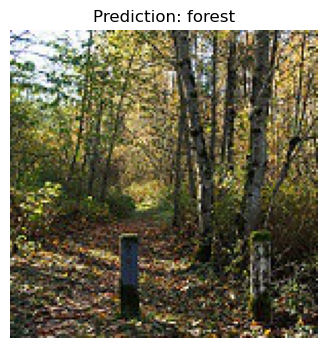

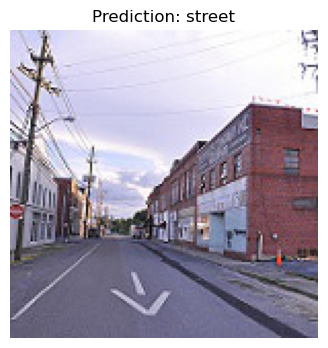

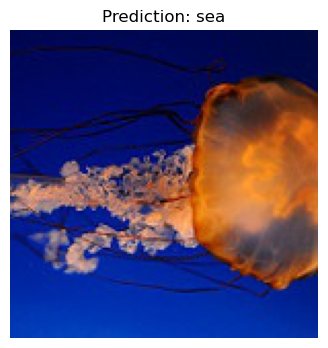

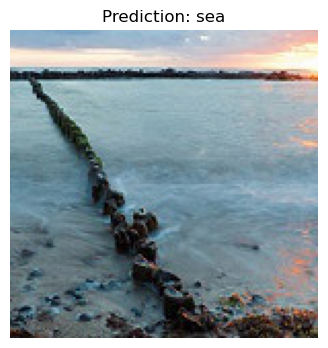

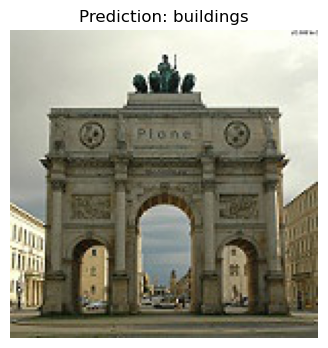

...

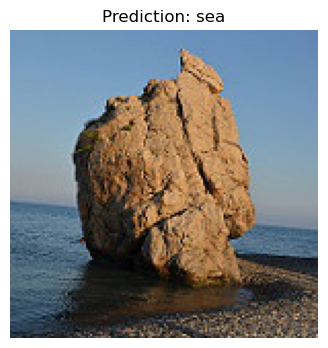

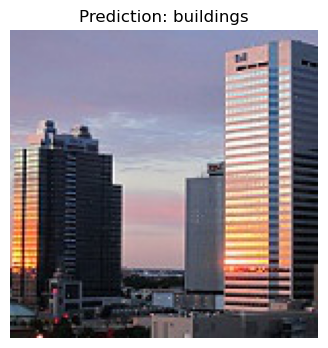

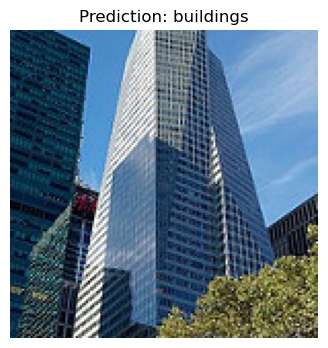

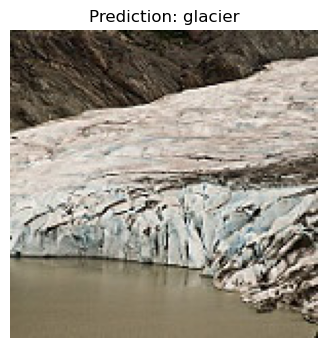

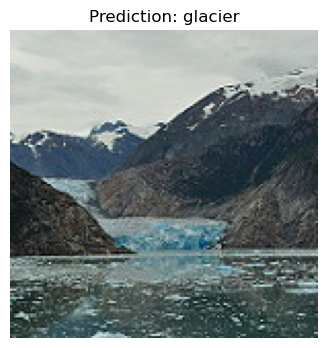

In [1]:
import torch
from torchvision import transforms, models
from torchvision.models import ConvNeXt_Tiny_Weights
from PIL import Image
import matplotlib.pyplot as plt
import os
import torch.nn as nn

# ------------------
# CONFIG
# ------------------

model_path = "best_convnext_tiny.pth"  # your saved weights
image_folder = "pred_images"  # folder containing images
class_names = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------
# LOAD MODEL
# ------------------

weights = ConvNeXt_Tiny_Weights.DEFAULT
model = models.convnext_tiny(weights=weights)

# Replace final layer to match your classes
model.classifier[2] = nn.Linear(model.classifier[2].in_features, len(class_names))

# Load trained weights
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)

model = model.to(device)
model.eval()

# ------------------
# TRANSFORMS (same as training)
# ------------------

preprocess = weights.transforms()

# ------------------
# PREDICT FUNCTION
# ------------------

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB")
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        _, pred = torch.max(outputs, 1)
        pred_class = class_names[pred.item()]
    
    return img, pred_class

# ------------------
# RUN ON ALL IMAGES
# ------------------

for filename in os.listdir(image_folder):
    if filename.lower().endswith((".png", ".jpg", ".jpeg")):
        path = os.path.join(image_folder, filename)
        
        img, pred = predict_image(path)

        plt.figure(figsize=(4,4))
        plt.imshow(img)
        plt.title(f"Prediction: {pred}")
        plt.axis("off")
        plt.show()
